But how do AI images and videos actually work? | Guest video by Welch Labs
Mar 7, 2026, 3:00 PM
But how do AI images and videos actually work? | Guest video by Welch Labs

While the best models are closed source, there are some compelling open-source (0:52) models.  => WAN.

This video of an astronaut was generated by an open-source model called WAN 2.1. We can (0:59) add to our prompt and have our astronaut hold a flag, hold a laptop, or hold a meeting. (1:04) If we cut down our prompt to just an astronaut, we get this. And if we cut down our prompt to (1:09) nothing, we interestingly still get this video of a woman.
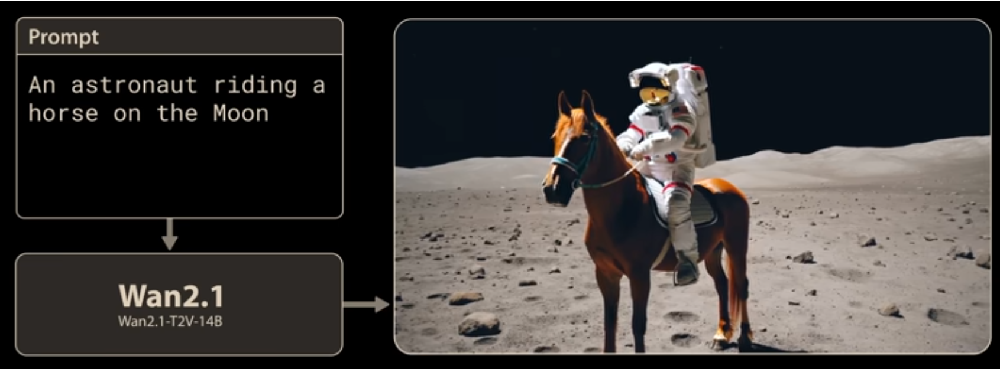

If we dig into our WAN model's source (1:15) code, we'll find that the video generation process begins with this call to a random number (1:20) generator, creating a video where the pixel intensity values are chosen randomly. 

Here's (1:26) what it looks like. From here, this pure noise video is passed into a transformer.
This is the (1:32) same type of AI model used by large language models like chat GPT. 

But instead of outputting (1:37) text, this transformer outputs another video that now looks like this, still mostly noise but with (1:44) some hints of structure. This new video is added to our pure noise video and then passed back (1:50) into the model again, producing a third video that looks like this.
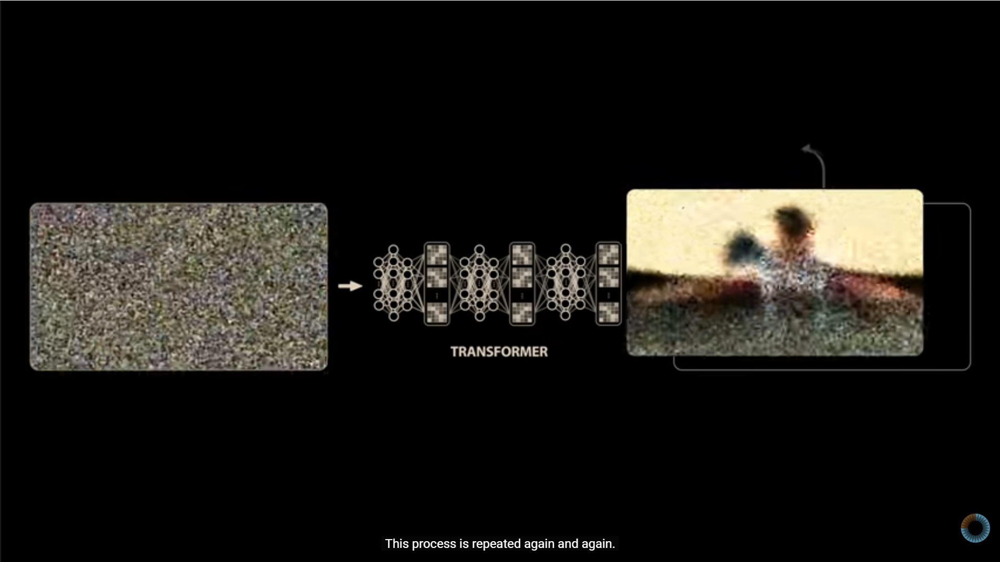


This process is repeated (1:55) again and again. 


Here's what the video looks like after five iterations, 10, 20, 30, 40, and finally (2:04) 50. Step by step, our transformer shapes pure noise into incredibly realistic video.
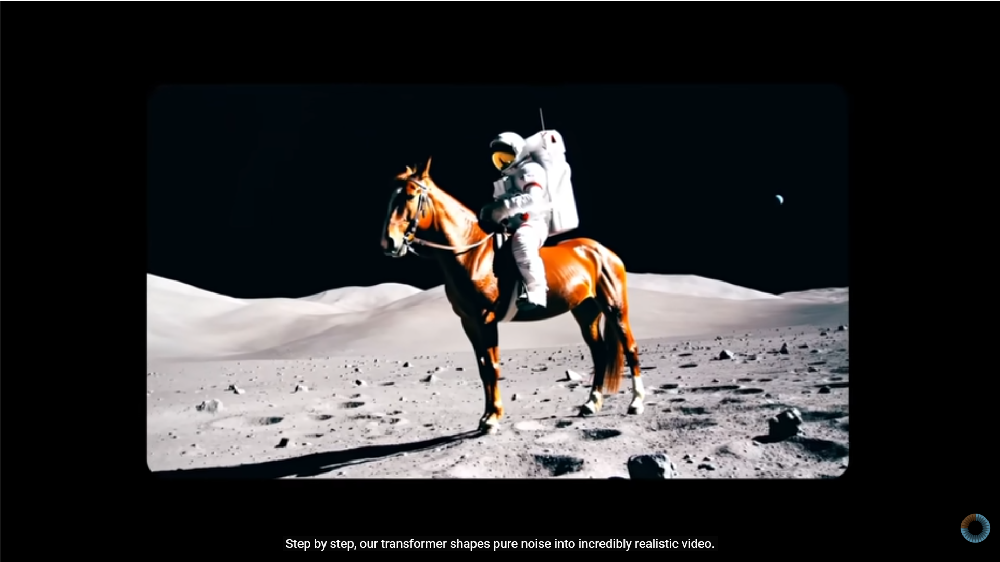


But what (2:13) exactly is the connection to Brownian motion here? And how is our model able to use text input so (2:18) expressively to shape noise into what our prompt describes? In this video, we'll unpack diffusion (2:24) models in three parts. 
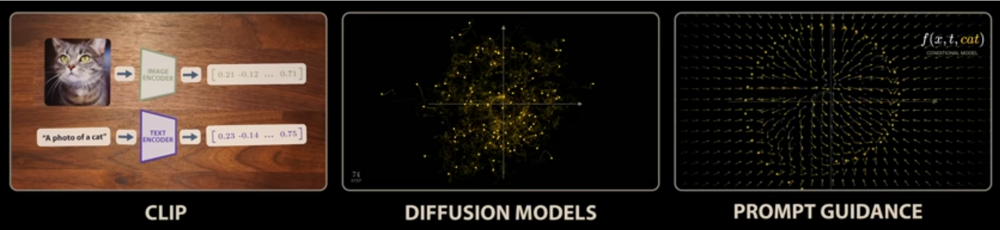


First, we'll look at a 2021 OpenAI paper and model called Clip. (2:31) As we'll see, Clip is really two models, a language model and a vision model that are (2:35) trained using a clever learning objective that allows them to learn this really powerful shared (2:40) space between words and pictures.
    
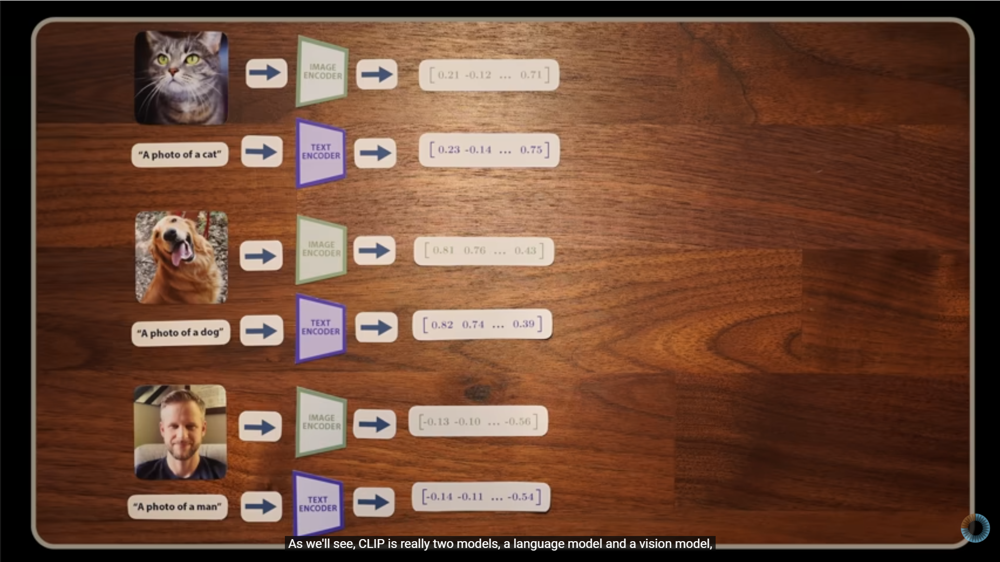
    
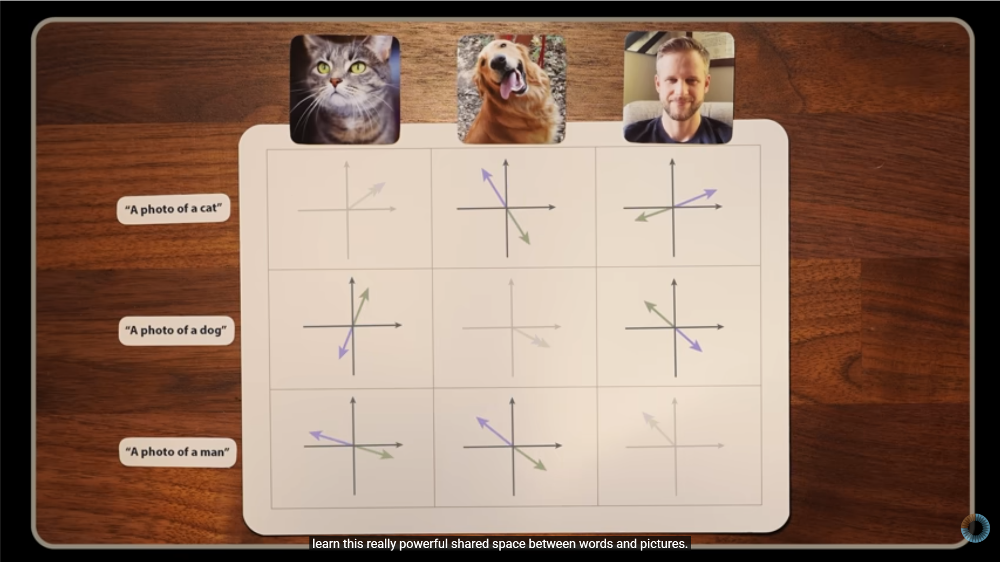
    

Experimenting with this space will help us get a feel for the (2:46) high dimensional spaces that diffusion models operate in. But learning a shared representation (2:51) is not enough to generate images. From here, we'll look at the diffusion process itself.

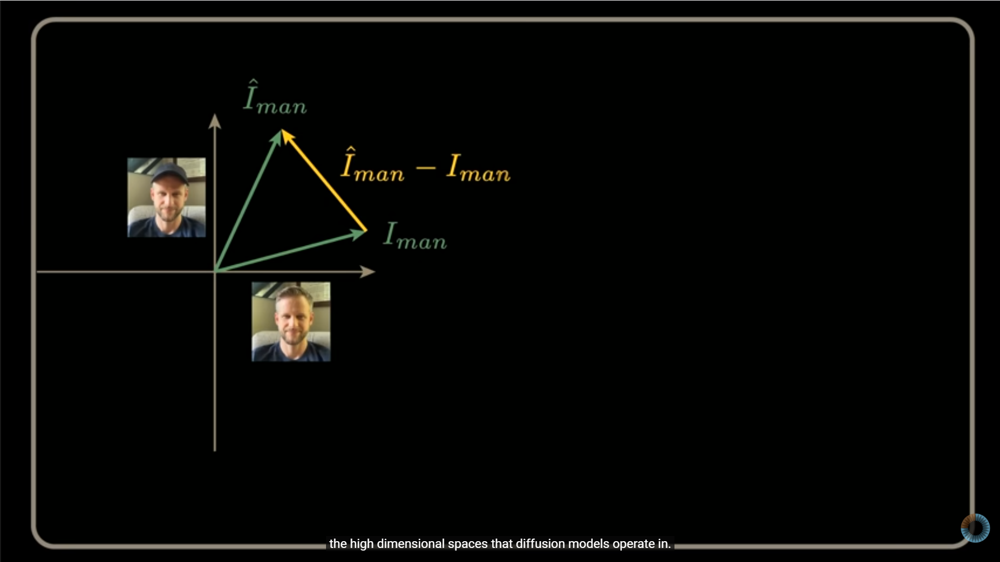
    

(2:57) At a high level, diffusion models are trained to remove noise from images or videos. However, if (3:03) you dig into the landmark papers in the field, you'll find that this naive understanding of (3:07) diffusion really doesn't hold up in practice. In this section, we'll dig into the connection (3:12) between diffusion models and diffusion processes in physics.
This connection will help us understand (3:17) how these models really work in practice and give us some powerful theory for dramatically (3:22) speeding up image and video generation. 


Finally, we'll bring these worlds together and see how (3:28) approaches like Clip are combined with diffusion models to condition and guide the generation (3:32) process towards the videos we asked for in our prompts. 2020 was a landmark year for language (3:40) modeling.


New results in neural scaling laws and OpenAI's GPT-3 showed that bigger really was (3:46) better. Massive models trained on massive datasets had capabilities that simply didn't exist in (3:52) smaller models. It didn't take long for researchers to apply similar ideas to images.

In February 2021, (4:00) a team at OpenAI released a new model architecture called Clip, trained on a dataset of 400 million (4:06) image and caption pairs scraped from the internet. Clip is composed of two models, one that processes (4:11) text and one that processes images. The output of each of these models is a vector of length 512, (4:18) and the central idea is that the vectors for a given image and its caption should be similar.

(4:23) To achieve this, the OpenAI team developed a clever training approach. (4:28) Given a batch of image-caption pairs, for example our batch could contain a picture of a cat, a dog, (4:34) and me, with the captions a photo of a cat, a photo of a dog, and a photo of a man. We then pass (4:39) our three images into our image model and our three captions into our text model.


We now have three (4:45) image vectors and three text vectors, and we would like the vectors for the matching image-caption (4:50) pairs to be similar. The clever idea from here is to make use of the similarity not just between the (4:56) corresponding images and captions, but between all image-caption pairs in the batch when training our (5:01) models. If we arrange our image vectors as the columns of a matrix and our text vectors as the (5:06) rows, the pairs of vectors along the diagonal of our matrix correspond to matching images and (5:11) captions, and all the pairs off-diagonal are non-matching images and captions.
The Clip training (5:17) objective seeks to maximize the similarity between corresponding image-caption pairs, (5:22) while simultaneously minimizing the similarity between non-corresponding image-caption pairs. (5:28) The C in CLIP stands for contrastive, because the model learns to contrast matching and non-matching (5:34) image-caption pairs. The CLIP algorithm measures similarity between vectors using a metric called (5:40) cosine similarity.
Geometrically, we can think of each of these vectors as pointing in some direction (5:45) in high-dimensional space. Cosine similarity measures the cosine of the angle between our (5:51) vectors in this space. So if our text and image vector point in the same direction, (5:56) the angle between our vectors will be zero, resulting in a maximum value for our cosine (6:00) similarity score of one.
So the image and text models that make up CLIP are trained to maximize (6:07) the alignment of related images and captions in this shared high-dimensional space, while (6:12) minimizing the alignment between unrelated images and captions. The learned geometry of this shared (6:18) vector space, known as a latent or embedding space, has some really interesting properties. (6:24) If I take two pictures of myself, one not wearing a hat and one wearing a hat, (6:29) and pass both of these into our CLIP image model, we get two vectors in our embedding space.
(6:35) Now if I take the vector corresponding to me wearing a hat and subtract the vector of me (6:40) not wearing a hat, we get a new vector in our embedding space. Now what text might this new (6:45) vector correspond to? Mathematically, we took the difference of me wearing a hat and me not (6:51) wearing a hat. We can search for corresponding text by passing a bunch of different words into (6:56) our text encoder, and for each computing the cosine similarity between our newly computed (7:01) difference vector and the text vector.
Testing a set of a few hundred common words, the top ring (7:08) to match with a similarity of 0.165 is the word hat, followed by cap and helmet. This is a (7:14) remarkable result. The learned geometry of CLIP's embedding space allows us to operate mathematically (7:21) on the pure ideas or concepts in our images and text, translating the differences in the content (7:27) of our images, like if there's a hat or not, into a literal distance between vectors in our embedding (7:33) space.


The OpenAI team showed that CLIP could produce very impressive image classification (7:38) results by simply passing an image into our image encoder, and then comparing the resulting vector (7:44) to a set of possible captions, one for each label that could be assigned to the image, and classifying (7:50) the image with whatever label resulted in the highest cosine similarity. So techniques like CLIP (7:55) give us a powerful shared representation of image and text, a kind of vector space of pure ideas. (8:03) However, our CLIP models only go one direction.


We can only map image and text to our shared (8:08) embedding space. We have no way of generating images and text from our embedding vectors. (8:15) 2020 turned out not only to be a transformative year for language modeling.


A few weeks after the (8:21) GPT-3 paper came out, a team at Berkeley published a paper called Denoising Diffusion Probabilistic (8:27) Models, now known as DDPM. The paper showed for the first time that it was possible to generate (8:34) very high quality images using a diffusion process, where pure noise is transformed step-by-step into (8:40) realistic images. The core idea behind diffusion models is pretty straightforward.

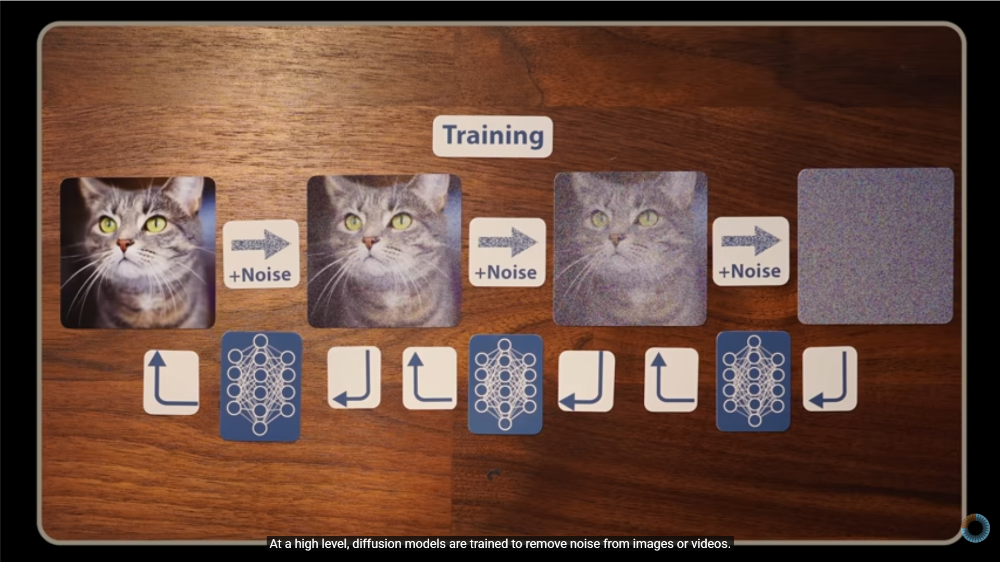

We take a set of (8:47) training images and add noise to each image step-by-step until the image is completely destroyed. (8:54) From here, we train a neural network to reverse this process. When I first learned about diffusion (8:59) models, I assumed that the models would be trained to remove noise a single step at a time.
Our model (9:05) would be trained to predict the image in step one, given the noisier image in step two, trained to (9:10) predict the image in step two, given the noisier image in step three, and so on. When it came time to (9:16) generate an image, we would pass pure noise into our model, take its output, and pass it back into (9:21) its input again and again. And after enough steps, we would have a nice image.
Now, it turns out that (9:27) this naive approach to building a diffusion model really does not work well. Virtually no modern (9:33) models work like this. These are the training and image generation algorithms from the Berkeley team's (9:39) paper.


The notation is a bit dense, but there's some key details we can pull out that will help (9:44) us understand what it takes to make these models really work. The first thing that surprised me (9:49) is that the team added random noise to images not just during training, but also during image (9:54) generation. Algorithm 2 tells us that when generating new images, at each step, after our (10:01) neural network predicts a less noisy image, we need to add random noise to this image before (10:06) passing it back into our model.
This added noise turns out to matter a lot in practice. (10:12) If we take a popular diffusion model like Stable Diffusion 2 and use the Berkeley team's image (10:17) generation approach, known as DDPM sampling, we can get some really nice images. Here's the (10:24) image we get when prompting the model with this prompt, asking for a tree in the desert.
Now, (10:29) if we remove the line of code that adds noise at each step of the generation process, (10:34) we end up with a tiny, sad, blurry tree. How is it that adding random noise while generating (10:40) images leads to better quality, sharper images? The second thing that surprised me when I (10:45) encountered the Berkeley team's approach was that the team wasn't training models to reverse (10:50) a single step in the noise addition process. Instead, the team takes an initial clean image, (10:55) which they call X0, and adds scaled random noise to the image, which they call epsilon.
(11:01) And from here, they train the model to predict the total noise that was added to the original image. (11:06) So the team is effectively asking the model to skip all the intermediate steps (11:11) and make a prediction about the original image. Intuitively, this learning task seems much more (11:16) difficult to me than just learning to make a noisy image slightly less noisy.
The Berkeley (11:21) team's paper and approach was a landmark result that put diffusion on the map. Why does adding (11:27) random noise while generating images and training the model like this work so well? (11:33) The DDPM paper draws on some fairly complex theory to arrive at these algorithms. (11:38) I'll include a link to a great tutorial in the description if you want to dig deeper into the (11:42) theory.
Happily, it turns out that there's a different but mathematically equivalent way of (11:47) understanding what diffusion models are really learning that we can use to get a visual and (11:51) intuitive sense for why the DDPM algorithms work so well. The key will be thinking of diffusion (11:57) models as learning a time-varying vector field. This perspective also leads to a more general (12:02) approach called flow-based models, which have become very popular recently.
To see how diffusion (12:08) models learn this time-varying vector field, let's temporarily simplify our learning problem. (12:15) One way to think about an image is as a point in high-dimensional space where the intensity value (12:20) of each pixel controls the position of the point in each dimension. If we reduce the size of our (12:25) images to only two pixels, we can visualize the distribution of our images by plotting the pixel (12:30) intensity value of our first pixel on the x-axis of a scatter plot and the pixel intensity of our (12:35) second pixel on the y-axis.
So an image with a black first pixel and a white second pixel would (12:42) show up at x equals 0 and y equals 1 on our scatter plot, and an all-white image would be at 1, 1, (12:48) and so on. Now, real images have a very specific structure in this high-dimensional space. (12:53) Let's create some structure for our points in our lower two-dimensional space for our diffusion (12:58) model to learn.
The exact structure we choose doesn't matter too much at this point. Let's (13:03) start with a spiral shape like this. The core idea of diffusion models, adding more and more (13:09) noise to an image and then training a neural network to reverse this process, looks really (13:13) interesting from the perspective of our 2D toy data.
When we add random noise to an image, (13:19) we're effectively changing each pixel's value by a random amount. In our toy 2D dataset, (13:25) where the coordinates of a point correspond to that image's pixel intensity values, (13:30) adding random noise is equivalent to taking a step in a randomly chosen direction. (13:34) As we add more and more noise to our image, our point goes on a random walk.
(13:39) This process is equivalent to the Brownian motion that drives diffusion processes in physics (13:43) and is where diffusion models get their name. From here, it's pretty wild to think about what (13:49) asking our diffusion model to do. Our model will see many different random walks from various (13:55) starting points in our dataset, and we're effectively asking our model to reverse the (13:59) clock, removing noise from our images by letting to play these diffusion processes backwards, (14:05) starting our points from random locations and recovering the original structure of our dataset.
(14:10) How can our model learn to reverse these random walks? If we consider the specific point at the (14:17) end of this 100-step random walk, in our naive diffusion modeling approach, where we ask our (14:22) model to denoise images a single step at a time, this is equivalent to giving our model the (14:27) coordinates of the final 100th point in our walk and asking our model to predict the coordinates (14:32) of our point at the 99th step. Although the direction of our 100th step is chosen randomly, (14:38) there will be some signal in aggregate for our model to learn from here. (14:42) Given enough training points, we expect many diffusion paths to go through this neighborhood, (14:48) and on average, our points will be diffusing away from our starting spiral, (14:52) so our model can learn to point back towards our spiral.
(14:56) We can now see why the Berkeley team's training objective works so well. (15:01) Instead of training the model to remove noise from images one step at a time, (15:05) this would correspond to predicting the coordinates of the 99th step given the 100th. (15:09) The team instead trained the model to predict the total noise added across the entire walk.
(15:14) On our plot, this is the vector pointing from our 100th step back to the original starting point (15:19) of the walk. It turns out that we can prove that learning to predict the noise added in the final (15:25) step of our walk is mathematically equivalent to learning to predict the total noise added (15:29) divided by the number of steps taken. This means that when our model learns to reverse a single (15:34) step, although our training data is noisy, we expect our model to ultimately learn to point (15:40) back towards x0.
By instead training our model to directly predict the vector pointing back towards (15:46) x0, we're significantly reducing the variance of our training examples, allowing our model (15:52) to learn much more efficiently without actually changing our underlying learning objective. (15:58) So for each point in our space, our model learns the direction pointing back towards the original (16:03) data distribution. This is also known as a score function, and the intuition here is that the (16:09) score function points us towards more likely less noisy data.
Now in practice, these learned (16:16) directions depend heavily on how much noise we add to our original data. After 100 steps, (16:22) most of our points are far from their starting points, so our model learns to move these points (16:27) back in the general direction of our spiral. However, if we train our model on examples (16:32) after only one diffusion step, we end up with a much more nuanced vector field, pointing to the (16:37) fine structure of our spiral.
There turns out to be a clever solution to this problem. Instead of (16:43) just passing in the coordinates of our point into our model, which we'll write here as a function f, (16:48) we can also pass in a time variable that corresponds to the number of steps taken in (16:53) our random walk. If we set t equal to 1 at our 100th step, then t would equal 0.99 at our 99th (17:00) step, and so on.
Conditioning our models on time like this turns out to be essential in practice, (17:06) allowing our model to learn coarse vector fields for large values of t and very refined structures (17:11) as t approaches 0. After training, we can watch the time evolution of our model. (17:18) We see this really interesting behavior as t approaches 0.4. Our learned vector field suddenly (17:24) transitions from pointing towards the center of the spiral to pointing towards the spiral itself. (17:30) It feels like a phase change.
We're now in a great position to resolve the final mystery of the (17:37) DDPM paper. How is it that adding random noise at each step while generating images leads to better (17:43) quality, sharper images? Let's follow the path of a single point guided by the DDPM image generation (17:50) algorithm. On our 2D dataset, generating an image is equivalent to starting at a random location (17:55) and working our way back to our spiral.
Starting at a randomly chosen location of x equals minus (18:02) 1.6 and y equals 1.8, our model's vector field points us back towards our spiral. (18:08) Following the DDPM algorithm, we take a small step in the direction returned by our model (18:13) and add scaled random noise, which effectively moves our point in a random direction. (18:19) We'll color the steps driven by our diffusion model in blue and our random steps in gray.
(18:24) Note that the scale of the random step may seem large, but following our DDPM algorithm, (18:29) the size of our random steps will come down as we progress. Repeating this process for 64 steps, (18:36) our particle jumps around quite a bit due to both our learned vector field changing (18:40) and our random noise steps, but ultimately lands nicely on our spiral. Repeating this process for (18:47) a point cloud of 256 points, our reverse diffusion process starts out looking like absolute chaos, (18:54) but does converge nicely with most points landing on our spiral.
(18:59) Now, what happens if we remove the noise addition steps? Running our reverse diffusion process again (19:05) without the random noise step, all of our points quickly move to the center of our spiral (19:10) and then make their way towards a single inside edge of the spiral. This result can help us make (19:16) sense of why we saw a sad blurry tree earlier when we removed this random noise step. Instead of (19:22) capturing our full spiral distribution as we did when we included a noise step, all of our generated (19:28) points end up close to the center or average of our spiral.
In the space of images, averages look (19:35) blurry. Conceptually, we can imagine different parts of our spiral corresponding to different (19:40) images of trees in the desert, and when we remove the random noise steps from our generation process, (19:46) our generated images end up in the center or average of these images, which looks like a (19:51) blurry mess. Now, note that the analogy between our toy dataset and high dimensional image dataset (19:56) breaks down a bit here.
If all the points on our spiral correspond to realistic images, since our (20:03) generated points do still end up landing on our 2D spiral, we would expect these generated points (20:08) to still look like real images, but likely with less diversity than we would want. However, in the (20:14) high dimensional space of images, it appears that our image generation process doesn't quite make it (20:19) to the manifold of realistic images, resulting in a blurry non-realistic image. This prediction of (20:26) the average is not a coincidence.
It turns out that we can show mathematically that our model (20:32) learns to point to the mean or average of our dataset conditioned on our input point and the (20:37) time in our diffusion process. One way to arrive at this result is to show that given the noise we (20:43) add in our forward process is Gaussian, for sufficiently small step sizes, our reverse (20:48) process will also follow a Gaussian distribution, where our model actually learns the mean of this (20:53) distribution. Since our model just predicts the mean of our normal distribution, to actually (20:59) sample from this distribution, we need to add zero mean Gaussian noise to our model's predicted value, (21:04) which is precisely what the DDPM image generation process does when we add random noise after each (21:10) step.
We can see this mean learning behavior most clearly early in our reverse diffusion process, (21:17) when t is close to 1 and our training points are far from our spiral. Our model's learned vector (21:22) field points towards the center or average of our dataset. So adding random noise during image (21:28) generation falls nicely out of theory, and in practice prevents all our points from landing (21:32) near the center or average of our dataset.
The DDPM paper put diffusion models on the map (21:38) as a viable method of generating images, but the diffusion approach did not immediately see (21:44) widespread adoption. A key issue with the DDPM approach at the time was the high compute demands (21:49) of the large number of steps required to generate high quality images, since each step required a (21:55) complete pass through a potentially very large neural network. A few months later, a pair of (22:00) papers from teams at Stanford and Google show that it's remarkably possible to generate high (22:05) quality images without actually adding random noise during the generation process, significantly (22:10) reducing the number of steps required.
The DDPM image generation process we've been looking at (22:16) can be expressed using a special type of differential equation known as a stochastic (22:20) differential equation. This first term represents the motion of our point driven by our model's (22:25) vector field, and the second term represents the random motions of our point. Adding these terms (22:31) together, we get the overall motion of our point at each step, dx.
From here, we can consider how (22:37) the distribution of all of our points evolves over time, where the motion of each point is governed by (22:42) this stochastic differential equation. This problem has been well studied in physics. (22:48) Using a key result from statistical mechanics known as the Fokker-Planck equation, (22:53) the Google Brain team showed that there's another differential equation, (22:57) this time an ordinary differential equation with no random component, (23:00) that results in the same exact final distribution of points as our stochastic differential equation.
(23:08) This result gives us a new algorithm for generating images using our model's learned (23:12) vector fields that does not require taking random steps along the way. (23:18) Exactly how our ordinary differential equation maps to an image generation algorithm is a bit (23:23) technical. I'll leave a link to a tutorial in the description.
The key result here though, (23:28) is that we end up with something that looks very similar to our DDPM image generation process, (23:33) but without the random noise addition at each step, and with a new scaling for the (23:37) sizes of steps that we take. This approach is generally known as DDIM. The scaling of our step (23:45) sizes, and especially how these step sizes vary throughout a reverse diffusion process, (23:49) matters a lot in practice.
When we just removed the random noise steps from our DDPM generation (23:56) algorithm earlier, all of our points ended up near the mean of our data, and we saw blurry results (24:02) for our generated images. Switching to our DDIM approach, we now have smaller scaling for our step (24:09) sizes that allow our trajectories to better follow the contour lines of our vector field, (24:14) and land nicely on the correct spiral distribution. And applying our DDIM algorithm to our tree in the (24:21) desert example, we're now able to generate nice results.
Comparing to our original DDPM algorithm (24:27) that required random steps, DDIM remarkably does not require any changes to model training, (24:33) but is able to generate high quality images in significantly fewer steps, (24:38) completely deterministically. Note that the theory does not tell us that our individual (24:43) images or points on our spiral will be the same, but instead that our final distribution of points (24:49) or images will be the same, regardless of whether we use our stochastic DDPM algorithm or our (24:54) deterministic DDIM algorithm. The WAN model we saw earlier uses a generalization of DDIM called (25:01) flow matching.
By early 2021, it was clear that diffusion models were capable of generating high (25:08) quality images, and thanks to image generation methods like DDIM, it was possible to generate (25:14) these images without using enormous amounts of compute. However, our ability to steer the (25:19) diffusion process using text prompts was still very limited. Earlier, we saw how Clip was able (25:25) to learn a powerful shared representation of images and text by concurrently training image (25:30) and text encoder models.
However, these models only go one way, converting text or images into (25:37) embedding vectors. These two problems potentially fit together in a really interesting way. (25:43) Diffusion models are able to potentially reverse the Clip image encoder, generating high quality (25:49) images, and the output vector of the Clip text encoder could be used to guide our diffusion (25:54) models toward the images or videos that we want.
So the high level idea here is that we could pass (26:00) in a prompt into the Clip text encoder to generate an embedding vector and use this embedding vector (26:05) to steer the diffusion process towards the image or video of what our prompt describes. (26:11) A team at OpenAI did exactly this in 2022, using image and caption pairs to train a diffusion model (26:18) to invert the Clip image encoder. Their approach yielded an incredible level of prompt adherence, (26:24) capturing an unprecedented level of detail from the input text.
(26:29) The team called their method UnClip, but their model is better known by its commercial name (26:33) Dolly2. But how do we actually use the embedding vectors for models like Clip to steer the diffusion (26:40) process? One option is to simply pass our text vector as another input into our diffusion model (26:46) and train as we normally would to remove noise. If we train our diffusion model using image and (26:52) caption pairs as the OpenAI team did, the idea here is that the model will learn to use the text (26:57) information to more accurately remove noise from images, since it now has more context about the (27:03) image that it's learning to denoise.
This technique is called conditioning. We used a similar approach (27:09) earlier when we conditioned our toy diffusion model on the number of time steps elapsed in the (27:13) diffusion process, allowing the model to learn core structure for large values of t and finer (27:19) structures as our training samples get closer to our original spiral. Interestingly, there turns (27:25) out to be a variety of ways we can pass in the text vector into our diffusion model.
(27:31) Some approaches use a mechanism called cross-attention to couple image and text information. (27:36) Other approaches simply add or append the embedded text vector to our diffusion model's input, (27:41) and some approaches pass in text information in multiple ways at once. (27:46) Now, it turns out that conditioning alone is not enough to achieve the level of prompt adherence (27:51) that we see in models like DALI-2.
If we take the stable diffusion tree in the desert example we've (27:57) been experimenting with and only condition our model with our text inputs, the model no longer (28:02) gives us everything we asked for. We get a shadow in a desert but no tree. Note that stable diffusion (28:09) was developed by a team at Heidelberg University around the same time as DALI-2 and works in a (28:14) similar way but is open source.
It turns out that there's one more powerful idea that we need to (28:20) effectively steer our diffusion models. We can see this idea in action by returning to our toy data (28:26) set one last time. If our overall spiral corresponds to realistic images, then different sections of (28:33) our spiral may correspond to different types of images.
Let's say this inner part is images of (28:38) people, this middle part is images of dogs, and this outer part is different images of cats. (28:43) Now, let's train the same diffusion model we trained earlier but in addition to passing in (28:48) our starting coordinates and the time of our diffusion process, we'll also pass in the points (28:53) class, person, cat, or dog. This extra signal should allow our model to steer points to the (28:59) right sections of our spiral based on each points class.
Running our generation process after assigning (29:06) person, dog, or cat labels to each point, we see that we're able to recover the overall structure (29:11) of our data set but the fit is not great and we see some confusion here between people and dog (29:16) images. Part of the problem here is that we're asking our model to simultaneously learn to point (29:22) to our overall spiral of realistic images and towards specific classes on our spiral. (29:28) If we consider this cat point for example, it starts off heading towards the center of our (29:33) spiral and as our class conditioned vector field shifts to point towards the cat region of our (29:38) spiral, our point moves towards this part of the spiral, but it doesn't quite make it.
The (29:44) modeling task of generally matching our overall spiral has overpowered our model's ability to (29:49) move our point in the direction of a specific class. Now, is there a way to decouple and maybe (29:55) even control these two factors? Remarkably, it turns out that

From <https://turboscribe.ai/transcript/3566850904966112991/but-how-do-ai-images-and-videos-actually-work-or-guest-video-by-welch-labs> 
